In [1]:
import numpy as np
import cv2
from matplotlib import pyplot as plt
import os


In [1]:
import sys
print(sys.executable)

/home/amitpandey/anaconda3/bin/python


In [2]:
from platform import python_version

print(python_version())

3.8.5


In [2]:
path = "../calibration-data/"

a = os.path.isdir(path)
print(a)

calibration_object = cv2.imread(os.path.join(path,"calib-object.jpg"))

True


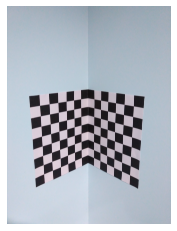

In [3]:
plt.imshow(calibration_object)
plt.axis('off')
plt.show()

In [4]:
#I have my image coordinates stored in a file, I am reading my coordinates from that file and storing  
# in two different lists of x and y to be used later.

x_list = []
y_list = []

textfilepath = "../amit.txt"
with open(textfilepath,'r') as file:  # note : when path already has double inverted commas, dont use double inverted comma with path in the with open function...
   a = file.readlines()
   
   print(a)

print('-----------------------')

print (type(x_list))
print('-----------------------')


for i in range (len(a)):
    x_cor,y_cor = a[i].strip('\n').split(',')
    x_cor = float(x_cor)
    y_cor = float(y_cor)
    x_list.extend([x_cor])
    y_list.extend([y_cor])
    
print (x_list)
    

['628,1897\n', '817,2070\n', '1417,1944\n', '1548,2081\n', '1790,2160\n', '1922,2191\n', '1780,2481\n', '1290,2639\n', '1012,2749\n', '864,2975\n', '2074,1855\n', '2222,2270\n', '2195,2991\n', '2053,2765\n', '1175,3017\n', '664,2497\n', '1543,2854\n', '2201,2630\n', '987,2029\n', '1129,1816\n', '1665,1771\n', '2414,1900\n', '2382,2507\n', '626,2094\n', '2401,2120\n']
-----------------------
<class 'list'>
-----------------------
[628.0, 817.0, 1417.0, 1548.0, 1790.0, 1922.0, 1780.0, 1290.0, 1012.0, 864.0, 2074.0, 2222.0, 2195.0, 2053.0, 1175.0, 664.0, 1543.0, 2201.0, 987.0, 1129.0, 1665.0, 2414.0, 2382.0, 626.0, 2401.0]


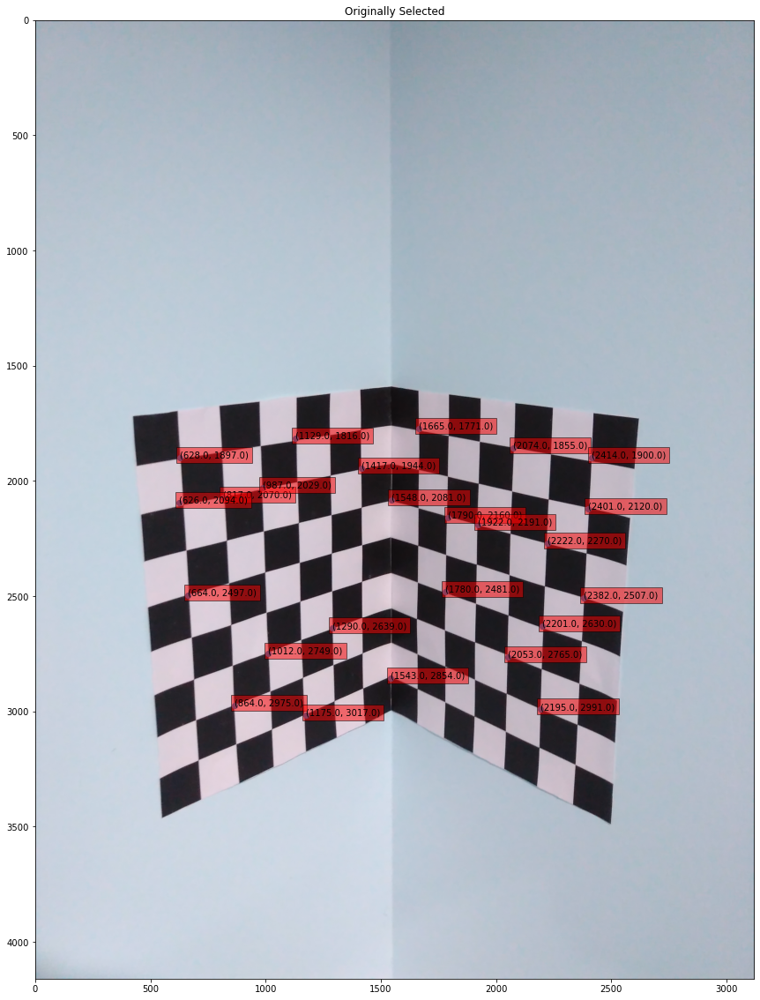

In [5]:
# points from paint tool and stored in the text file that we just read.

%matplotlib inline

plt.figure(figsize=(20,20))
plt.imshow(calibration_object)
plt.scatter(x_list,y_list)
plt.title('Originally Selected')

for i in range(len(x_list)):
    tupl = list(zip(x_list,y_list))
    plt.text(x_list[i],y_list[i],tupl[i],bbox=dict(facecolor='red', alpha=0.5))


plt.show()

In [7]:
#manually finding the world coordinate.
world_cord = np.array([[6,1,0],[5,2,0],[1,2,0],[0,3,0],[0,3,2],[0,3,3],[0,5,2],[2,6,0],[4,6,0],[5,7,0],[0,1,4],[0,3,5],[0,7,5],[0,6,4],[3,8,0],[6,4,0],[0,8,1],[0,5,4],[4,2,0],[3,1,0],[0,1,2],[0,1,7],[0,4,7],[6,2,0],[0,2,7]], dtype = np.float32)
world_cord = world_cord*0.028
world_cord

array([[0.16800001, 0.028     , 0.        ],
       [0.14      , 0.056     , 0.        ],
       [0.028     , 0.056     , 0.        ],
       [0.        , 0.08400001, 0.        ],
       [0.        , 0.08400001, 0.056     ],
       [0.        , 0.08400001, 0.08400001],
       [0.        , 0.14      , 0.056     ],
       [0.056     , 0.16800001, 0.        ],
       [0.112     , 0.16800001, 0.        ],
       [0.14      , 0.19600001, 0.        ],
       [0.        , 0.028     , 0.112     ],
       [0.        , 0.08400001, 0.14      ],
       [0.        , 0.19600001, 0.14      ],
       [0.        , 0.16800001, 0.112     ],
       [0.08400001, 0.224     , 0.        ],
       [0.16800001, 0.112     , 0.        ],
       [0.        , 0.224     , 0.028     ],
       [0.        , 0.14      , 0.112     ],
       [0.112     , 0.056     , 0.        ],
       [0.08400001, 0.028     , 0.        ],
       [0.        , 0.028     , 0.056     ],
       [0.        , 0.028     , 0.19600001],
       [0.

In [8]:
world_cord_x = world_cord[:,0]
world_cord_y = world_cord[:,1]
world_cord_z = world_cord[:,2]

In [9]:
list_of_homogenous_worldcord = [] # making an empty list

for i in range (len(world_cord_x)):
    homo = [world_cord_x[i],world_cord_y[i],world_cord_z[i],1] # converting euclidean to homogeneous coordinate
    #print(type(homo))
    list_of_homogenous_worldcord.append(homo) # appending to list to make a list of list.

In [30]:
from itertools import combinations 
list_index = list(combinations(np.arange(25), 6))
len(list_index)
list(list_index[8888])
#index_list = list_index

[0, 2, 3, 4, 6, 21]

In [46]:
def DLT(idx):
    Matx = np.zeros(24).reshape(2,12)
    for i in idx:
        internal_parameters = np.array([[world_cord_x[i], world_cord_y[i], world_cord_z[i], 1, 0, 0, 0, 0, -(x_list[i]*world_cord_x[i]), -(x_list[i]*world_cord_y[i]), -(x_list[i]*world_cord_z[i]), -(x_list[i])],
                                   [0, 0, 0, 0, world_cord_x[i], world_cord_y[i], world_cord_z[i], 1, -(y_list[i]*world_cord_x[i]), -(y_list[i]*world_cord_y[i]), -(y_list[i]*world_cord_z[i]), -(y_list[i])]])
    
        Matx = np.vstack((Matx,internal_parameters))
    
    Matx = Matx[2:]


    u, s, vh = np.linalg.svd(Matx, full_matrices=True) # performing svd on the matrix
    transpose_of_vt = vh.T
    p = transpose_of_vt[:,11] # Picking the last column of the 'V' matrix or pick last row of 'Vh' and transpose it

    p = p.reshape(3,4) # reshape the vector to form a 3x4 projection matrix.
    projection_matx = p


    list_of_projected_image_cord_in_euclidean = []

    for i in range (len(list_of_homogenous_worldcord)):
        world_cord_homo = list_of_homogenous_worldcord[i] # selecting points one by one and finding projection
        projection = projection_matx@world_cord_homo# using projection matrix having p34 as 1
        
        list_of_projected_image_cord_in_euclidean.append(projection)
    
    x_list_projected = []
    y_list_projected = []

    for i in range(len(list_of_projected_image_cord_in_euclidean)):
        x_list_projected.append(list_of_projected_image_cord_in_euclidean[i][0])
        y_list_projected.append(list_of_projected_image_cord_in_euclidean[i][1])

    x_list_projected = [round(num) for num in x_list_projected] #rounding to nearest int
    y_list_projected = [round(num) for num in y_list_projected]




#now to find error over just the first 6 points that were used to find the projection matrix :


    summation = 0.0

    for i in range(6):
        print(x_list_projected[i])
        print(x_list[i])
        summation = summation + ((x_list_projected[i]-x_list[i])**2) + ((y_list_projected[i]-y_list[i])**2)

    mean = summation/25

    error = (mean)**0.5

    return error, projection_matx




In [47]:
def Ransac(itr,index_list):
    best_rmse = 10000000
    best_p = []
    for i in range (50000):
        idx = list(index_list[i])
        print(idx)
        error, projection_matx = DLT(idx)
        if error < best_rmse :
            best_rmse = error
            best_p = projection_matx
            
    return best_p, best_rmse
        
        

In [48]:
itr = 50000
best_p, best_rmse = Ransac(itr,index_list)

[0, 1, 2, 3, 4, 5]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 3, 4, 6]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 3, 4, 7]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 3, 4, 8]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 3, 4, 9]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 3, 4, 10]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 3, 4, 11]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 3, 4, 12]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 3, 4, 13]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 3, 4, 14]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 3, 4, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 3, 4, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 3, 4, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 3, 4, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 4, 5, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 4, 5, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 4, 5, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 4, 5, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 4, 5, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 4, 5, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 4, 6, 7]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 4, 6, 8]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 4, 6, 9]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 4, 6, 10]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 4, 6, 11]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 4, 6, 12]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 4, 6, 13]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 4, 6,

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 5, 9, 11]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 5, 9, 12]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 5, 9, 13]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 5, 9, 14]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 5, 9, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 5, 9, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 5, 9, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 5, 9, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 5, 9, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 5, 9, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 5, 9, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 5, 9, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 5, 9, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 5,

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 6, 15, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 6, 15, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 6, 15, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 6, 15, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 6, 15, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 6, 15, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 6, 16, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 6, 16, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 6, 16, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 6, 16, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 6, 16, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 6, 16, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 6, 16, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 8, 12, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 8, 12, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 8, 12, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 8, 13, 14]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 8, 13, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 8, 13, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 8, 13, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 8, 13, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 8, 13, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 8, 13, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 8, 13, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 8, 13, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 8, 13, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 10, 15, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 10, 16, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 10, 16, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 10, 16, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 10, 16, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 10, 16, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 10, 16, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 10, 16, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 10, 16, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 10, 17, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 10, 17, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 10, 17, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 10, 17, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 13, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 13, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 13, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 13, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 13, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 13, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 14, 15, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 14, 15, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 14, 15, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 14, 15, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 14, 15, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 14, 15, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 2, 14, 15, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 4, 8, 10]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 4, 8, 11]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 4, 8, 12]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 4, 8, 13]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 4, 8, 14]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 4, 8, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 4, 8, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 4, 8, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 4, 8, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 4, 8, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 4, 8, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 4, 8, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 4, 8, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 4,

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 5, 11, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 5, 11, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 5, 11, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 5, 12, 13]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 5, 12, 14]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 5, 12, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 5, 12, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 5, 12, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 5, 12, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 5, 12, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 5, 12, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 5, 12, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 5, 12, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 6, 19, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 6, 20, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 6, 20, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 6, 20, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 6, 20, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 6, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 6, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 6, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 6, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 6, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 6, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 7, 8, 9]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 7, 8, 10]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 8, 15, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 8, 15, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 8, 15, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 8, 15, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 8, 15, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 8, 16, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 8, 16, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 8, 16, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 8, 16, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 8, 16, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 8, 16, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 8, 16, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 8, 16, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 10, 19, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 10, 20, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 10, 20, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 10, 20, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 10, 20, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 10, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 10, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 10, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 10, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 10, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 10, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 11, 12, 13]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 11, 12, 14]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 14, 16, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 14, 16, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 14, 16, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 14, 16, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 14, 16, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 14, 17, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 14, 17, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 14, 17, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 14, 17, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 14, 17, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 14, 17, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 14, 17, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 3, 14, 18, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 4, 5, 10, 13]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 4, 5, 10, 14]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 4, 5, 10, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 4, 5, 10, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 4, 5, 10, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 4, 5, 10, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 4, 5, 10, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 4, 5, 10, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 4, 5, 10, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 4, 5, 10, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 4, 5, 10, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 4, 5, 10, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 4, 5, 11, 12]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 4, 6, 15, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 4, 6, 15, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 4, 6, 15, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 4, 6, 16, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 4, 6, 16, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 4, 6, 16, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 4, 6, 16, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 4, 6, 16, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 4, 6, 16, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 4, 6, 16, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 4, 6, 16, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 4, 6, 17, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 4, 6, 17, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 4, 8, 10, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 4, 8, 10, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 4, 8, 10, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 4, 8, 10, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 4, 8, 10, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 4, 8, 10, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 4, 8, 10, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 4, 8, 11, 12]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 4, 8, 11, 13]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 4, 8, 11, 14]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 4, 8, 11, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 4, 8, 11, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 4, 8, 11, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 4, 10, 12, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 4, 10, 12, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 4, 10, 12, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 4, 10, 12, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 4, 10, 13, 14]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 4, 10, 13, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 4, 10, 13, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 4, 10, 13, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 4, 10, 13, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 4, 10, 13, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 4, 10, 13, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 4, 10, 13, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 4, 10, 13, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 4, 13, 14, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 4, 13, 14, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 4, 13, 14, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 4, 13, 14, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 4, 13, 15, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 4, 13, 15, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 4, 13, 15, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 4, 13, 15, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 4, 13, 15, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 4, 13, 15, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 4, 13, 15, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 4, 13, 15, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 4, 13, 15, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 5, 6, 7, 9]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 5, 6, 7, 10]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 5, 6, 7, 11]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 5, 6, 7, 12]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 5, 6, 7, 13]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 5, 6, 7, 14]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 5, 6, 7, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 5, 6, 7, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 5, 6, 7, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 5, 6, 7, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 5, 6, 7, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 5, 6, 7, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 5, 6, 7, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 5, 6, 

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 5, 7, 11, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 5, 7, 11, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 5, 7, 11, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 5, 7, 12, 13]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 5, 7, 12, 14]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 5, 7, 12, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 5, 7, 12, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 5, 7, 12, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 5, 7, 12, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 5, 7, 12, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 5, 7, 12, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 5, 7, 12, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 5, 7, 12, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 5, 9, 11, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 5, 9, 11, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 5, 9, 11, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 5, 9, 11, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 5, 9, 11, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 5, 9, 11, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 5, 9, 12, 13]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 5, 9, 12, 14]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 5, 9, 12, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 5, 9, 12, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 5, 9, 12, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 5, 9, 12, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 5, 9, 12, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 5, 11, 18, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 5, 11, 18, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 5, 11, 18, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 5, 11, 18, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 5, 11, 19, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 5, 11, 19, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 5, 11, 19, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 5, 11, 19, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 5, 11, 19, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 5, 11, 20, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 5, 11, 20, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 5, 11, 20, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 5, 11, 20, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 5, 16, 18, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 5, 16, 18, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 5, 16, 18, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 5, 16, 18, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 5, 16, 19, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 5, 16, 19, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 5, 16, 19, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 5, 16, 19, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 5, 16, 19, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 5, 16, 20, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 5, 16, 20, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 5, 16, 20, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 5, 16, 20, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 6, 8, 9, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 6, 8, 10, 11]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 6, 8, 10, 12]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 6, 8, 10, 13]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 6, 8, 10, 14]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 6, 8, 10, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 6, 8, 10, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 6, 8, 10, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 6, 8, 10, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 6, 8, 10, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 6, 8, 10, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 6, 8, 10, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 6, 8, 10, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0


0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 6, 10, 11, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 6, 10, 11, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 6, 10, 11, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 6, 10, 11, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 6, 10, 11, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 6, 10, 11, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 6, 10, 11, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 6, 10, 11, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 6, 10, 12, 13]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 6, 10, 12, 14]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 6, 10, 12, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 6, 10, 12, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 6, 10, 12, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 6, 12, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 6, 12, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 6, 12, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 6, 12, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 6, 12, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 6, 13, 14, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 6, 13, 14, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 6, 13, 14, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 6, 13, 14, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 6, 13, 14, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 6, 13, 14, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 6, 13, 14, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 6, 13, 14, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 6, 22, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 7, 8, 9, 10]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 7, 8, 9, 11]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 7, 8, 9, 12]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 7, 8, 9, 13]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 7, 8, 9, 14]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 7, 8, 9, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 7, 8, 9, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 7, 8, 9, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 7, 8, 9, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 7, 8, 9, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 7, 8, 9, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 7, 8, 9, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 7, 

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 7, 9, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 7, 9, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 7, 9, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 7, 9, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 7, 10, 11, 12]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 7, 10, 11, 13]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 7, 10, 11, 14]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 7, 10, 11, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 7, 10, 11, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 7, 10, 11, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 7, 10, 11, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 7, 10, 11, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 7, 10, 11, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 7, 12, 19, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 7, 12, 20, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 7, 12, 20, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 7, 12, 20, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 7, 12, 20, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 7, 12, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 7, 12, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 7, 12, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 7, 12, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 7, 12, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 7, 12, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 7, 13, 14, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 7, 13, 14, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 7, 19, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 7, 19, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 7, 19, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 7, 19, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 7, 20, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 7, 20, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 7, 20, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 7, 20, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 7, 20, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 7, 20, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 7, 21, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 7, 21, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 7, 21, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 8, 11, 13, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 8, 11, 13, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 8, 11, 13, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 8, 11, 13, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 8, 11, 13, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 8, 11, 13, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 8, 11, 13, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 8, 11, 13, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 8, 11, 14, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 8, 11, 14, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 8, 11, 14, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 8, 11, 14, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 8, 11, 14, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 8, 14, 20, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 8, 14, 20, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 8, 14, 20, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 8, 14, 20, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 8, 14, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 8, 14, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 8, 14, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 8, 14, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 8, 14, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 8, 14, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 8, 15, 16, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 8, 15, 16, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 8, 15, 16, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 9, 10, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 9, 10, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 9, 10, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 9, 11, 12, 13]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 9, 11, 12, 14]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 9, 11, 12, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 9, 11, 12, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 9, 11, 12, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 9, 11, 12, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 9, 11, 12, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 9, 11, 12, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 9, 11, 12, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 9, 11, 12, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 9, 14, 17, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 9, 14, 17, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 9, 14, 17, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 9, 14, 17, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 9, 14, 18, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 9, 14, 18, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 9, 14, 18, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 9, 14, 18, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 9, 14, 18, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 9, 14, 18, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 9, 14, 19, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 9, 14, 19, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 9, 14, 19, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 10, 12, 13, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 10, 12, 13, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 10, 12, 13, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 10, 12, 13, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 10, 12, 13, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 10, 12, 13, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 10, 12, 13, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 10, 12, 13, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 10, 12, 13, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 10, 12, 14, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 10, 12, 14, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 10, 12, 14, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 10, 12, 14, 18]
0
628.0
0
817.0
0
1417.0


0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 10, 16, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 10, 17, 18, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 10, 17, 18, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 10, 17, 18, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 10, 17, 18, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 10, 17, 18, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 10, 17, 18, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 10, 17, 19, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 10, 17, 19, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 10, 17, 19, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 10, 17, 19, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 10, 17, 19, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 10, 17, 20, 21]
0
628.0
0
817.0
0
1417.0


0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 11, 15, 16, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 11, 15, 16, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 11, 15, 16, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 11, 15, 17, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 11, 15, 17, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 11, 15, 17, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 11, 15, 17, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 11, 15, 17, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 11, 15, 17, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 11, 15, 17, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 11, 15, 18, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 11, 15, 18, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 11, 15, 18, 21]
0
628.0
0
817.0
0
1417.0


0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 12, 15, 17, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 12, 15, 17, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 12, 15, 18, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 12, 15, 18, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 12, 15, 18, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 12, 15, 18, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 12, 15, 18, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 12, 15, 18, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 12, 15, 19, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 12, 15, 19, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 12, 15, 19, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 12, 15, 19, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 12, 15, 19, 24]
0
628.0
0
817.0
0
1417.0


0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 13, 17, 20, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 13, 17, 20, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 13, 17, 20, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 13, 17, 20, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 13, 17, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 13, 17, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 13, 17, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 13, 17, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 13, 17, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 13, 17, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 13, 18, 19, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 13, 18, 19, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 13, 18, 19, 22]
0
628.0
0
817.0
0
1417.0


0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 15, 18, 20, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 15, 18, 20, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 15, 18, 20, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 15, 18, 20, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 15, 18, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 15, 18, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 15, 18, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 15, 18, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 15, 18, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 15, 18, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 15, 19, 20, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 15, 19, 20, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 1, 15, 19, 20, 23]
0
628.0
0
817.0
0
1417.0


0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 4, 8, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 4, 9, 10]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 4, 9, 11]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 4, 9, 12]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 4, 9, 13]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 4, 9, 14]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 4, 9, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 4, 9, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 4, 9, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 4, 9, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 4, 9, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 4, 9, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 4, 9, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 4,

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 5, 11, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 5, 12, 13]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 5, 12, 14]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 5, 12, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 5, 12, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 5, 12, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 5, 12, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 5, 12, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 5, 12, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 5, 12, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 5, 12, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 5, 12, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 5, 12, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 6, 17, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 6, 17, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 6, 17, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 6, 18, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 6, 18, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 6, 18, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 6, 18, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 6, 18, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 6, 18, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 6, 19, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 6, 19, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 6, 19, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 6, 19, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 8, 14, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 8, 14, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 8, 14, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 8, 14, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 8, 14, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 8, 14, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 8, 14, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 8, 15, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 8, 15, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 8, 15, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 8, 15, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 8, 15, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 8, 15, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 10, 16, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 10, 16, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 10, 16, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 10, 16, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 10, 16, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 10, 16, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 10, 16, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 10, 16, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 10, 17, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 10, 17, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 10, 17, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 10, 17, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 10, 17, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 13, 19, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 13, 19, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 13, 19, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 13, 19, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 13, 19, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 13, 20, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 13, 20, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 13, 20, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 13, 20, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 13, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 13, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 13, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 3, 13, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 4, 5, 8, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 4, 5, 8, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 4, 5, 8, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 4, 5, 8, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 4, 5, 8, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 4, 5, 8, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 4, 5, 8, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 4, 5, 8, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 4, 5, 8, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 4, 5, 8, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 4, 5, 9, 10]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 4, 5, 9, 11]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 4, 5, 9, 12]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 4, 5,

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 4, 6, 13, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 4, 6, 13, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 4, 6, 14, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 4, 6, 14, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 4, 6, 14, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 4, 6, 14, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 4, 6, 14, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 4, 6, 14, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 4, 6, 14, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 4, 6, 14, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 4, 6, 14, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 4, 6, 14, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 4, 6, 15, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 4, 8, 11, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 4, 8, 11, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 4, 8, 11, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 4, 8, 11, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 4, 8, 11, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 4, 8, 11, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 4, 8, 12, 13]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 4, 8, 12, 14]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 4, 8, 12, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 4, 8, 12, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 4, 8, 12, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 4, 8, 12, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 4, 8, 12, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 4, 10, 12, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 4, 10, 12, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 4, 10, 12, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 4, 10, 12, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 4, 10, 13, 14]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 4, 10, 13, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 4, 10, 13, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 4, 10, 13, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 4, 10, 13, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 4, 10, 13, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 4, 10, 13, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 4, 10, 13, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 4, 10, 13, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 4, 12, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 4, 12, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 4, 12, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 4, 12, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 4, 13, 14, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 4, 13, 14, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 4, 13, 14, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 4, 13, 14, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 4, 13, 14, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 4, 13, 14, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 4, 13, 14, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 4, 13, 14, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 4, 13, 14, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 5, 6, 7, 11]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 5, 6, 7, 12]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 5, 6, 7, 13]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 5, 6, 7, 14]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 5, 6, 7, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 5, 6, 7, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 5, 6, 7, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 5, 6, 7, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 5, 6, 7, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 5, 6, 7, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 5, 6, 7, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 5, 6, 7, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 5, 6, 7, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 5, 6,

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 5, 7, 13, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 5, 7, 13, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 5, 7, 14, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 5, 7, 14, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 5, 7, 14, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 5, 7, 14, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 5, 7, 14, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 5, 7, 14, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 5, 7, 14, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 5, 7, 14, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 5, 7, 14, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 5, 7, 14, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 5, 7, 15, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 5, 9, 13, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 5, 9, 13, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 5, 9, 13, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 5, 9, 13, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 5, 9, 13, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 5, 9, 13, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 5, 9, 13, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 5, 9, 13, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 5, 9, 13, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 5, 9, 14, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 5, 9, 14, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 5, 9, 14, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 5, 9, 14, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 5, 11, 18, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 5, 11, 18, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 5, 11, 19, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 5, 11, 19, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 5, 11, 19, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 5, 11, 19, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 5, 11, 19, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 5, 11, 20, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 5, 11, 20, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 5, 11, 20, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 5, 11, 20, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 5, 11, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 5, 11, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

1548.0
0
1790.0
0
1922.0
[0, 2, 5, 15, 20, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 5, 15, 20, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 5, 15, 20, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 5, 15, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 5, 15, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 5, 15, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 5, 15, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 5, 15, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 5, 15, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 5, 16, 17, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 5, 16, 17, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 5, 16, 17, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 5, 16, 17, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 5, 16,

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 6, 7, 18, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 6, 7, 18, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 6, 7, 18, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 6, 7, 19, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 6, 7, 19, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 6, 7, 19, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 6, 7, 19, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 6, 7, 19, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 6, 7, 20, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 6, 7, 20, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 6, 7, 20, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 6, 7, 20, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 6, 7, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 6, 9, 17, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 6, 9, 17, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 6, 9, 17, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 6, 9, 17, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 6, 9, 17, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 6, 9, 18, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 6, 9, 18, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 6, 9, 18, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 6, 9, 18, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 6, 9, 18, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 6, 9, 18, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 6, 9, 19, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 6, 9, 19, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 6, 12, 14, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 6, 12, 14, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 6, 12, 14, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 6, 12, 14, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 6, 12, 14, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 6, 12, 14, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 6, 12, 14, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 6, 12, 14, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 6, 12, 15, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 6, 12, 15, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 6, 12, 15, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 6, 12, 15, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 6, 12, 15, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 6, 16, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 6, 17, 18, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 6, 17, 18, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 6, 17, 18, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 6, 17, 18, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 6, 17, 18, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 6, 17, 18, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 6, 17, 19, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 6, 17, 19, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 6, 17, 19, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 6, 17, 19, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 6, 17, 19, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 6, 17, 20, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 7, 9, 11, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 7, 9, 11, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 7, 9, 11, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 7, 9, 11, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 7, 9, 11, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 7, 9, 12, 13]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 7, 9, 12, 14]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 7, 9, 12, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 7, 9, 12, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 7, 9, 12, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 7, 9, 12, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 7, 9, 12, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 7, 9, 12, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 7, 11, 15, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 7, 11, 15, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 7, 11, 15, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 7, 11, 15, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 7, 11, 15, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 7, 11, 15, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 7, 11, 15, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 7, 11, 15, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 7, 11, 15, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 7, 11, 16, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 7, 11, 16, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 7, 11, 16, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 7, 11, 16, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 7, 15, 16, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 7, 15, 17, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 7, 15, 17, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 7, 15, 17, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 7, 15, 17, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 7, 15, 17, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 7, 15, 17, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 7, 15, 17, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 7, 15, 18, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 7, 15, 18, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 7, 15, 18, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 7, 15, 18, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 7, 15, 18, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 8, 10, 11, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 8, 10, 11, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 8, 10, 11, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 8, 10, 11, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 8, 10, 11, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 8, 10, 11, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 8, 10, 11, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 8, 10, 11, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 8, 10, 11, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 8, 10, 11, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 8, 10, 12, 13]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 8, 10, 12, 14]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 8, 10, 12, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 8, 12, 18, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 8, 12, 18, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 8, 12, 18, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 8, 12, 18, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 8, 12, 18, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 8, 12, 19, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 8, 12, 19, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 8, 12, 19, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 8, 12, 19, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 8, 12, 19, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 8, 12, 20, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 8, 12, 20, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 8, 12, 20, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 8, 18, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 8, 18, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 8, 19, 20, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 8, 19, 20, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 8, 19, 20, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 8, 19, 20, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 8, 19, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 8, 19, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 8, 19, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 8, 19, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 8, 19, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 8, 19, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 8, 20, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 9, 12, 16, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 9, 12, 16, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 9, 12, 16, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 9, 12, 16, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 9, 12, 16, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 9, 12, 16, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 9, 12, 16, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 9, 12, 16, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 9, 12, 17, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 9, 12, 17, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 9, 12, 17, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 9, 12, 17, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 9, 12, 17, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 9, 17, 20, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 9, 17, 20, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 9, 17, 20, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 9, 17, 20, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 9, 17, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 9, 17, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 9, 17, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 9, 17, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 9, 17, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 9, 17, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 9, 18, 19, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 9, 18, 19, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 9, 18, 19, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 10, 13, 16, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 10, 13, 16, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 10, 13, 16, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 10, 13, 17, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 10, 13, 17, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 10, 13, 17, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 10, 13, 17, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 10, 13, 17, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 10, 13, 17, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 10, 13, 17, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 10, 13, 18, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 10, 13, 18, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 10, 13, 18, 21]
0
628.0
0
817.0
0
1417.0


0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 11, 12, 14, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 11, 12, 14, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 11, 12, 15, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 11, 12, 15, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 11, 12, 15, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 11, 12, 15, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 11, 12, 15, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 11, 12, 15, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 11, 12, 15, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 11, 12, 15, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 11, 12, 15, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 11, 12, 16, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 11, 12, 16, 18]
0
628.0
0
817.0
0
1417.0


0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 11, 17, 18, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 11, 17, 18, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 11, 17, 19, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 11, 17, 19, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 11, 17, 19, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 11, 17, 19, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 11, 17, 19, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 11, 17, 20, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 11, 17, 20, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 11, 17, 20, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 11, 17, 20, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 11, 17, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 11, 17, 21, 23]
0
628.0
0
817.0
0
1417.0


0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 12, 17, 18, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 12, 17, 18, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 12, 17, 19, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 12, 17, 19, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 12, 17, 19, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 12, 17, 19, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 12, 17, 19, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 12, 17, 20, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 12, 17, 20, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 12, 17, 20, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 12, 17, 20, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 12, 17, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 12, 17, 21, 23]
0
628.0
0
817.0
0
1417.0


0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 14, 15, 17, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 14, 15, 17, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 14, 15, 17, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 14, 15, 17, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 14, 15, 17, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 14, 15, 18, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 14, 15, 18, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 14, 15, 18, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 14, 15, 18, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 14, 15, 18, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 14, 15, 18, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 14, 15, 19, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 14, 15, 19, 21]
0
628.0
0
817.0
0
1417.0


1548.0
0
1790.0
0
1922.0
[0, 2, 16, 18, 19, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 16, 18, 19, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 16, 18, 19, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 16, 18, 19, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 16, 18, 19, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 16, 18, 20, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 16, 18, 20, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 16, 18, 20, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 16, 18, 20, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 16, 18, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 16, 18, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 16, 18, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 2, 16, 18, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0


0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 4, 5, 12, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 4, 5, 12, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 4, 5, 12, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 4, 5, 12, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 4, 5, 12, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 4, 5, 12, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 4, 5, 12, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 4, 5, 12, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 4, 5, 12, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 4, 5, 12, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 4, 5, 13, 14]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 4, 5, 13, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 4, 5, 13, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 4, 6, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 4, 6, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 4, 6, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 4, 6, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 4, 6, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 4, 6, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 4, 7, 8, 9]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 4, 7, 8, 10]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 4, 7, 8, 11]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 4, 7, 8, 12]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 4, 7, 8, 13]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 4, 7, 8, 14]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 4, 7, 8, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 4, 8, 14, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 4, 8, 14, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 4, 8, 15, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 4, 8, 15, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 4, 8, 15, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 4, 8, 15, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 4, 8, 15, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 4, 8, 15, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 4, 8, 15, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 4, 8, 15, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 4, 8, 15, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 4, 8, 16, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 4, 8, 16, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 4, 10, 16, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 4, 10, 16, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 4, 10, 16, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 4, 10, 17, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 4, 10, 17, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 4, 10, 17, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 4, 10, 17, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 4, 10, 17, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 4, 10, 17, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 4, 10, 17, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 4, 10, 18, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 4, 10, 18, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 4, 10, 18, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 4, 13, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 4, 13, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 4, 13, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 4, 13, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 4, 13, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 4, 14, 15, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 4, 14, 15, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 4, 14, 15, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 4, 14, 15, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 4, 14, 15, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 4, 14, 15, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 4, 14, 15, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 4, 14, 15, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 5, 6, 10, 12]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 5, 6, 10, 13]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 5, 6, 10, 14]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 5, 6, 10, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 5, 6, 10, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 5, 6, 10, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 5, 6, 10, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 5, 6, 10, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 5, 6, 10, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 5, 6, 10, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 5, 6, 10, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 5, 6, 10, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 5, 6, 10, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 5, 7, 19, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 5, 7, 19, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 5, 7, 19, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 5, 7, 19, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 5, 7, 20, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 5, 7, 20, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 5, 7, 20, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 5, 7, 20, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 5, 7, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 5, 7, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 5, 7, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 5, 7, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 5, 7, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 5, 9, 18, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 5, 9, 18, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 5, 9, 19, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 5, 9, 19, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 5, 9, 19, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 5, 9, 19, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 5, 9, 19, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 5, 9, 20, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 5, 9, 20, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 5, 9, 20, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 5, 9, 20, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 5, 9, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 5, 9, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 5, 12, 16, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 5, 12, 17, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 5, 12, 17, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 5, 12, 17, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 5, 12, 17, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 5, 12, 17, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 5, 12, 17, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 5, 12, 17, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 5, 12, 18, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 5, 12, 18, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 5, 12, 18, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 5, 12, 18, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 5, 12, 18, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 5, 18, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 5, 18, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 5, 18, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 5, 18, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 5, 18, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 5, 18, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 5, 19, 20, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 5, 19, 20, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 5, 19, 20, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 5, 19, 20, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 5, 19, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 5, 19, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 5, 19, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 6, 8, 13, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 6, 8, 13, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 6, 8, 13, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 6, 8, 13, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 6, 8, 14, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 6, 8, 14, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 6, 8, 14, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 6, 8, 14, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 6, 8, 14, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 6, 8, 14, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 6, 8, 14, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 6, 8, 14, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 6, 8, 14, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 6, 10, 17, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 6, 10, 17, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 6, 10, 17, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 6, 10, 17, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 6, 10, 17, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 6, 10, 18, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 6, 10, 18, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 6, 10, 18, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 6, 10, 18, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 6, 10, 18, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 6, 10, 18, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 6, 10, 19, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 6, 10, 19, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 6, 14, 15, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 6, 14, 15, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 6, 14, 15, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 6, 14, 15, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 6, 14, 15, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 6, 14, 15, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 6, 14, 15, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 6, 14, 16, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 6, 14, 16, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 6, 14, 16, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 6, 14, 16, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 6, 14, 16, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 6, 14, 16, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 7, 8, 13, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 7, 8, 14, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 7, 8, 14, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 7, 8, 14, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 7, 8, 14, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 7, 8, 14, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 7, 8, 14, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 7, 8, 14, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 7, 8, 14, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 7, 8, 14, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 7, 8, 14, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 7, 8, 15, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 7, 8, 15, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 7, 10, 17, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 7, 10, 17, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 7, 10, 18, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 7, 10, 18, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 7, 10, 18, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 7, 10, 18, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 7, 10, 18, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 7, 10, 18, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 7, 10, 19, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 7, 10, 19, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 7, 10, 19, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 7, 10, 19, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 7, 10, 19, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 7, 13, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 7, 13, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 7, 13, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 7, 13, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 7, 13, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 7, 14, 15, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 7, 14, 15, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 7, 14, 15, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 7, 14, 15, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 7, 14, 15, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 7, 14, 15, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 7, 14, 15, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 7, 14, 15, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 8, 9, 15, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 8, 9, 15, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 8, 9, 15, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 8, 9, 15, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 8, 9, 15, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 8, 9, 15, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 8, 9, 15, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 8, 9, 15, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 8, 9, 15, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 8, 9, 16, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 8, 9, 16, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 8, 9, 16, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 8, 9, 16, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 8, 12, 13, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 8, 12, 13, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 8, 12, 13, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 8, 12, 13, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 8, 12, 14, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 8, 12, 14, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 8, 12, 14, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 8, 12, 14, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 8, 12, 14, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 8, 12, 14, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 8, 12, 14, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 8, 12, 14, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 8, 12, 14, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 8, 17, 18, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 8, 17, 18, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 8, 17, 19, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 8, 17, 19, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 8, 17, 19, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 8, 17, 19, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 8, 17, 19, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 8, 17, 20, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 8, 17, 20, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 8, 17, 20, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 8, 17, 20, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 8, 17, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 8, 17, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 9, 12, 13, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 9, 12, 13, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 9, 12, 13, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 9, 12, 13, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 9, 12, 13, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 9, 12, 13, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 9, 12, 13, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 9, 12, 13, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 9, 12, 14, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 9, 12, 14, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 9, 12, 14, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 9, 12, 14, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 9, 12, 14, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 9, 16, 20, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 9, 16, 20, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 9, 16, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 9, 16, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 9, 16, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 9, 16, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 9, 16, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 9, 16, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 9, 17, 18, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 9, 17, 18, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 9, 17, 18, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 9, 17, 18, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 9, 17, 18, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 10, 13, 15, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 10, 13, 15, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 10, 13, 16, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 10, 13, 16, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 10, 13, 16, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 10, 13, 16, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 10, 13, 16, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 10, 13, 16, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 10, 13, 16, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 10, 13, 16, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 10, 13, 17, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 10, 13, 17, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 10, 13, 17, 20]
0
628.0
0
817.0
0
1417.0


0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 11, 12, 15, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 11, 12, 15, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 11, 12, 15, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 11, 12, 15, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 11, 12, 15, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 11, 12, 15, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 11, 12, 15, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 11, 12, 16, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 11, 12, 16, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 11, 12, 16, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 11, 12, 16, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 11, 12, 16, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 11, 12, 16, 22]
0
628.0
0
817.0
0
1417.0


0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 11, 18, 19, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 11, 18, 19, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 11, 18, 19, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 11, 18, 19, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 11, 18, 19, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 11, 18, 20, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 11, 18, 20, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 11, 18, 20, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 11, 18, 20, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 11, 18, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 11, 18, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 11, 18, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 11, 18, 22, 23]
0
628.0
0
817.0
0
1417.0


0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 12, 18, 20, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 12, 18, 20, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 12, 18, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 12, 18, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 12, 18, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 12, 18, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 12, 18, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 12, 18, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 12, 19, 20, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 12, 19, 20, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 12, 19, 20, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 12, 19, 20, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 12, 19, 21, 22]
0
628.0
0
817.0
0
1417.0


0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 14, 15, 18, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 14, 15, 18, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 14, 15, 18, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 14, 15, 19, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 14, 15, 19, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 14, 15, 19, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 14, 15, 19, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 14, 15, 19, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 14, 15, 20, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 14, 15, 20, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 14, 15, 20, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 14, 15, 20, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 14, 15, 21, 22]
0
628.0
0
817.0
0
1417.0


0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 16, 19, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 16, 19, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 16, 19, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 16, 19, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 16, 19, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 16, 19, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 16, 20, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 16, 20, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 16, 20, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 16, 20, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 16, 20, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 16, 20, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 3, 16, 21, 22, 23]
0
628.0
0
817.0
0
1417.0


0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 5, 6, 19, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 5, 6, 19, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 5, 6, 19, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 5, 6, 19, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 5, 6, 19, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 5, 6, 20, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 5, 6, 20, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 5, 6, 20, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 5, 6, 20, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 5, 6, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 5, 6, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 5, 6, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 5, 6, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 5, 8, 14, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 5, 8, 14, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 5, 8, 14, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 5, 8, 14, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 5, 8, 14, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 5, 8, 14, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 5, 8, 15, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 5, 8, 15, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 5, 8, 15, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 5, 8, 15, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 5, 8, 15, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 5, 8, 15, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 5, 8, 15, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 5, 10, 18, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 5, 10, 18, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 5, 10, 18, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 5, 10, 18, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 5, 10, 18, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 5, 10, 19, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 5, 10, 19, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 5, 10, 19, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 5, 10, 19, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 5, 10, 19, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 5, 10, 20, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 5, 10, 20, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 5, 10, 20, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 5, 14, 15, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 5, 14, 15, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 5, 14, 16, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 5, 14, 16, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 5, 14, 16, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 5, 14, 16, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 5, 14, 16, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 5, 14, 16, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 5, 14, 16, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 5, 14, 16, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 5, 14, 17, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 5, 14, 17, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 5, 14, 17, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 6, 7, 12, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 6, 7, 12, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 6, 7, 13, 14]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 6, 7, 13, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 6, 7, 13, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 6, 7, 13, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 6, 7, 13, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 6, 7, 13, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 6, 7, 13, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 6, 7, 13, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 6, 7, 13, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 6, 7, 13, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 6, 7, 13, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 6, 9, 12, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 6, 9, 13, 14]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 6, 9, 13, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 6, 9, 13, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 6, 9, 13, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 6, 9, 13, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 6, 9, 13, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 6, 9, 13, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 6, 9, 13, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 6, 9, 13, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 6, 9, 13, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 6, 9, 13, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 6, 9, 14, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 6, 11, 20, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 6, 11, 20, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 6, 11, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 6, 11, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 6, 11, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 6, 11, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 6, 11, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 6, 11, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 6, 12, 13, 14]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 6, 12, 13, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 6, 12, 13, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 6, 12, 13, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 6, 12, 13, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 6, 16, 20, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 6, 16, 20, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 6, 16, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 6, 16, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 6, 16, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 6, 16, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 6, 16, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 6, 16, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 6, 17, 18, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 6, 17, 18, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 6, 17, 18, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 6, 17, 18, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 6, 17, 18, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 7, 9, 13, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 7, 9, 13, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 7, 9, 13, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 7, 9, 13, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 7, 9, 13, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 7, 9, 13, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 7, 9, 13, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 7, 9, 13, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 7, 9, 13, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 7, 9, 13, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 7, 9, 14, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 7, 9, 14, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 7, 9, 14, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 7, 11, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 7, 11, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 7, 11, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 7, 11, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 7, 11, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 7, 12, 13, 14]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 7, 12, 13, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 7, 12, 13, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 7, 12, 13, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 7, 12, 13, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 7, 12, 13, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 7, 12, 13, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 7, 12, 13, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 7, 16, 20, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 7, 16, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 7, 16, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 7, 16, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 7, 16, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 7, 16, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 7, 16, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 7, 17, 18, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 7, 17, 18, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 7, 17, 18, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 7, 17, 18, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 7, 17, 18, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 7, 17, 18, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 8, 10, 16, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 8, 10, 16, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 8, 10, 16, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 8, 10, 16, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 8, 10, 17, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 8, 10, 17, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 8, 10, 17, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 8, 10, 17, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 8, 10, 17, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 8, 10, 17, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 8, 10, 17, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 8, 10, 18, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 8, 10, 18, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 8, 13, 20, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 8, 13, 20, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 8, 13, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 8, 13, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 8, 13, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 8, 13, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 8, 13, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 8, 13, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 8, 14, 15, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 8, 14, 15, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 8, 14, 15, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 8, 14, 15, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 8, 14, 15, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 9, 10, 14, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 9, 10, 14, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 9, 10, 14, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 9, 10, 15, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 9, 10, 15, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 9, 10, 15, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 9, 10, 15, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 9, 10, 15, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 9, 10, 15, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 9, 10, 15, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 9, 10, 15, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 9, 10, 15, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 9, 10, 16, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 9, 13, 18, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 9, 13, 18, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 9, 13, 18, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 9, 13, 18, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 9, 13, 18, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 9, 13, 18, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 9, 13, 19, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 9, 13, 19, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 9, 13, 19, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 9, 13, 19, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 9, 13, 19, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 9, 13, 20, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 9, 13, 20, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 10, 11, 16, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 10, 11, 16, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 10, 11, 16, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 10, 11, 16, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 10, 11, 17, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 10, 11, 17, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 10, 11, 17, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 10, 11, 17, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 10, 11, 17, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 10, 11, 17, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 10, 11, 17, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 10, 11, 18, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 10, 11, 18, 20]
0
628.0
0
817.0
0
1417.0


0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 10, 15, 19, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 10, 15, 19, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 10, 15, 19, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 10, 15, 19, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 10, 15, 20, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 10, 15, 20, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 10, 15, 20, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 10, 15, 20, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 10, 15, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 10, 15, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 10, 15, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 10, 15, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 10, 15, 22, 24]
0
628.0
0
817.0
0
1417.0


0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 11, 14, 16, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 11, 14, 16, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 11, 14, 16, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 11, 14, 16, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 11, 14, 16, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 11, 14, 16, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 11, 14, 16, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 11, 14, 16, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 11, 14, 17, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 11, 14, 17, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 11, 14, 17, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 11, 14, 17, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 11, 14, 17, 22]
0
628.0
0
817.0
0
1417.0


0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 12, 14, 15, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 12, 14, 15, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 12, 14, 15, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 12, 14, 15, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 12, 14, 16, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 12, 14, 16, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 12, 14, 16, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 12, 14, 16, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 12, 14, 16, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 12, 14, 16, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 12, 14, 16, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 12, 14, 16, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 12, 14, 17, 18]
0
628.0
0
817.0
0
1417.0


0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 13, 15, 19, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 13, 15, 20, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 13, 15, 20, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 13, 15, 20, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 13, 15, 20, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 13, 15, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 13, 15, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 13, 15, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 13, 15, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 13, 15, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 13, 15, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 13, 16, 17, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 13, 16, 17, 19]
0
628.0
0
817.0
0
1417.0


0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 15, 16, 17, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 15, 16, 17, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 15, 16, 17, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 15, 16, 17, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 15, 16, 17, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 15, 16, 18, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 15, 16, 18, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 15, 16, 18, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 15, 16, 18, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 15, 16, 18, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 15, 16, 18, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 15, 16, 19, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 4, 15, 16, 19, 21]
0
628.0
0
817.0
0
1417.0


0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 6, 7, 8, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 6, 7, 8, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 6, 7, 8, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 6, 7, 8, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 6, 7, 9, 10]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 6, 7, 9, 11]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 6, 7, 9, 12]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 6, 7, 9, 13]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 6, 7, 9, 14]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 6, 7, 9, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 6, 7, 9, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 6, 7, 9, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 6, 7, 9, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 6, 7,

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 6, 8, 17, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 6, 8, 17, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 6, 8, 17, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 6, 8, 17, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 6, 8, 18, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 6, 8, 18, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 6, 8, 18, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 6, 8, 18, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 6, 8, 18, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 6, 8, 18, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 6, 8, 19, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 6, 8, 19, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 6, 8, 19, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 6, 11, 12, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 6, 11, 12, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 6, 11, 12, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 6, 11, 12, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 6, 11, 12, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 6, 11, 12, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 6, 11, 12, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 6, 11, 12, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 6, 11, 12, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 6, 11, 13, 14]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 6, 11, 13, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 6, 11, 13, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 6, 11, 13, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 6, 14, 17, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 6, 14, 18, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 6, 14, 18, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 6, 14, 18, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 6, 14, 18, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 6, 14, 18, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 6, 14, 18, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 6, 14, 19, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 6, 14, 19, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 6, 14, 19, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 6, 14, 19, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 6, 14, 19, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 6, 14, 20, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 7, 8, 15, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 7, 8, 15, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 7, 8, 16, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 7, 8, 16, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 7, 8, 16, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 7, 8, 16, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 7, 8, 16, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 7, 8, 16, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 7, 8, 16, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 7, 8, 16, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 7, 8, 17, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 7, 8, 17, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 7, 8, 17, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 7, 10, 19, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 7, 10, 19, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 7, 10, 19, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 7, 10, 20, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 7, 10, 20, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 7, 10, 20, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 7, 10, 20, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 7, 10, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 7, 10, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 7, 10, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 7, 10, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 7, 10, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 7, 10, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 7, 14, 16, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 7, 14, 16, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 7, 14, 16, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 7, 14, 16, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 7, 14, 17, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 7, 14, 17, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 7, 14, 17, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 7, 14, 17, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 7, 14, 17, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 7, 14, 17, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 7, 14, 17, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 7, 14, 18, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 7, 14, 18, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 8, 9, 13, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 8, 9, 13, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 8, 9, 14, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 8, 9, 14, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 8, 9, 14, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 8, 9, 14, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 8, 9, 14, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 8, 9, 14, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 8, 9, 14, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 8, 9, 14, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 8, 9, 14, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 8, 9, 14, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 8, 9, 15, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 8, 11, 20, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 8, 11, 20, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 8, 11, 20, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 8, 11, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 8, 11, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 8, 11, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 8, 11, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 8, 11, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 8, 11, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 8, 12, 13, 14]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 8, 12, 13, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 8, 12, 13, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 8, 12, 13, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 8, 16, 18, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 8, 16, 18, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 8, 16, 18, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 8, 16, 18, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 8, 16, 18, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 8, 16, 19, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 8, 16, 19, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 8, 16, 19, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 8, 16, 19, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 8, 16, 19, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 8, 16, 20, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 8, 16, 20, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 8, 16, 20, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 9, 11, 17, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 9, 11, 18, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 9, 11, 18, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 9, 11, 18, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 9, 11, 18, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 9, 11, 18, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 9, 11, 18, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 9, 11, 19, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 9, 11, 19, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 9, 11, 19, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 9, 11, 19, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 9, 11, 19, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 9, 11, 20, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 9, 15, 19, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 9, 15, 19, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 9, 15, 20, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 9, 15, 20, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 9, 15, 20, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 9, 15, 20, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 9, 15, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 9, 15, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 9, 15, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 9, 15, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 9, 15, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 9, 15, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 9, 16, 17, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 10, 12, 16, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 10, 12, 16, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 10, 12, 16, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 10, 12, 16, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 10, 12, 17, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 10, 12, 17, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 10, 12, 17, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 10, 12, 17, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 10, 12, 17, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 10, 12, 17, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 10, 12, 17, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 10, 12, 18, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 10, 12, 18, 20]
0
628.0
0
817.0
0
1417.0


0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 10, 17, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 10, 18, 19, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 10, 18, 19, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 10, 18, 19, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 10, 18, 19, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 10, 18, 19, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 10, 18, 20, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 10, 18, 20, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 10, 18, 20, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 10, 18, 20, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 10, 18, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 10, 18, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 10, 18, 21, 24]
0
628.0
0
817.0
0
1417.0


0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 11, 15, 18, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 11, 15, 18, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 11, 15, 18, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 11, 15, 18, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 11, 15, 18, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 11, 15, 19, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 11, 15, 19, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 11, 15, 19, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 11, 15, 19, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 11, 15, 19, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 11, 15, 20, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 11, 15, 20, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 11, 15, 20, 23]
0
628.0
0
817.0
0
1417.0


0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 12, 15, 19, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 12, 15, 19, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 12, 15, 19, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 12, 15, 19, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 12, 15, 20, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 12, 15, 20, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 12, 15, 20, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 12, 15, 20, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 12, 15, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 12, 15, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 12, 15, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 12, 15, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 12, 15, 22, 24]
0
628.0
0
817.0
0
1417.0


0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 13, 17, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 13, 17, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 13, 17, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 13, 17, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 13, 17, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 13, 18, 19, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 13, 18, 19, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 13, 18, 19, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 13, 18, 19, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 13, 18, 19, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 13, 18, 20, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 13, 18, 20, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 13, 18, 20, 23]
0
628.0
0
817.0
0
1417.0


0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 15, 18, 19, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 15, 18, 19, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 15, 18, 19, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 15, 18, 19, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 15, 18, 19, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 15, 18, 20, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 15, 18, 20, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 15, 18, 20, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 15, 18, 20, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 15, 18, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 15, 18, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 15, 18, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 5, 15, 18, 22, 23]
0
628.0
0
817.0
0
1417.0


0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 7, 8, 13, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 7, 8, 13, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 7, 8, 13, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 7, 8, 13, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 7, 8, 13, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 7, 8, 13, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 7, 8, 13, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 7, 8, 14, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 7, 8, 14, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 7, 8, 14, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 7, 8, 14, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 7, 8, 14, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 7, 8, 14, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 7, 10, 16, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 7, 10, 16, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 7, 10, 17, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 7, 10, 17, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 7, 10, 17, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 7, 10, 17, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 7, 10, 17, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 7, 10, 17, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 7, 10, 17, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 7, 10, 18, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 7, 10, 18, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 7, 10, 18, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 7, 10, 18, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 7, 13, 20, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 7, 13, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 7, 13, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 7, 13, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 7, 13, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 7, 13, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 7, 13, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 7, 14, 15, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 7, 14, 15, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 7, 14, 15, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 7, 14, 15, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 7, 14, 15, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 7, 14, 15, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 8, 9, 13, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 8, 9, 13, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 8, 9, 13, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 8, 9, 13, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 8, 9, 14, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 8, 9, 14, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 8, 9, 14, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 8, 9, 14, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 8, 9, 14, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 8, 9, 14, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 8, 9, 14, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 8, 9, 14, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 8, 9, 14, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 8, 11, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 8, 11, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 8, 11, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 8, 11, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 8, 11, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 8, 11, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 8, 12, 13, 14]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 8, 12, 13, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 8, 12, 13, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 8, 12, 13, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 8, 12, 13, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 8, 12, 13, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 8, 12, 13, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 8, 16, 20, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 8, 16, 20, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 8, 16, 20, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 8, 16, 20, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 8, 16, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 8, 16, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 8, 16, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 8, 16, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 8, 16, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 8, 16, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 8, 17, 18, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 8, 17, 18, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 8, 17, 18, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 9, 11, 20, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 9, 11, 20, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 9, 11, 20, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 9, 11, 20, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 9, 11, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 9, 11, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 9, 11, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 9, 11, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 9, 11, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 9, 11, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 9, 12, 13, 14]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 9, 12, 13, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 9, 12, 13, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 9, 16, 20, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 9, 16, 20, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 9, 16, 20, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 9, 16, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 9, 16, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 9, 16, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 9, 16, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 9, 16, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 9, 16, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 9, 17, 18, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 9, 17, 18, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 9, 17, 18, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 9, 17, 18, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 10, 13, 16, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 10, 13, 16, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 10, 13, 16, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 10, 13, 16, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 10, 13, 16, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 10, 13, 16, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 10, 13, 16, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 10, 13, 16, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 10, 13, 17, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 10, 13, 17, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 10, 13, 17, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 10, 13, 17, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 10, 13, 17, 22]
0
628.0
0
817.0
0
1417.0


0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 11, 12, 15, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 11, 12, 15, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 11, 12, 15, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 11, 12, 15, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 11, 12, 15, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 11, 12, 15, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 11, 12, 15, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 11, 12, 15, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 11, 12, 15, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 11, 12, 16, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 11, 12, 16, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 11, 12, 16, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 11, 12, 16, 20]
0
628.0
0
817.0
0
1417.0


0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 11, 17, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 11, 17, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 11, 17, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 11, 17, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 11, 18, 19, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 11, 18, 19, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 11, 18, 19, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 11, 18, 19, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 11, 18, 19, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 11, 18, 20, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 11, 18, 20, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 11, 18, 20, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 11, 18, 20, 24]
0
628.0
0
817.0
0
1417.0


0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 12, 17, 20, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 12, 17, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 12, 17, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 12, 17, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 12, 17, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 12, 17, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 12, 17, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 12, 18, 19, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 12, 18, 19, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 12, 18, 19, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 12, 18, 19, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 12, 18, 19, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 12, 18, 20, 21]
0
628.0
0
817.0
0
1417.0


0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 14, 15, 18, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 14, 15, 19, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 14, 15, 19, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 14, 15, 19, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 14, 15, 19, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 14, 15, 19, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 14, 15, 20, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 14, 15, 20, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 14, 15, 20, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 14, 15, 20, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 14, 15, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 14, 15, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 14, 15, 21, 24]
0
628.0
0
817.0
0
1417.0


0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 16, 19, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 16, 19, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 16, 19, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 16, 20, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 16, 20, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 16, 20, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 16, 20, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 16, 20, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 16, 20, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 16, 21, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 16, 21, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 16, 21, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 6, 16, 22, 23, 24]
0
628.0
0
817.0
0
1417.0


0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 8, 10, 13, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 8, 10, 13, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 8, 10, 14, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 8, 10, 14, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 8, 10, 14, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 8, 10, 14, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 8, 10, 14, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 8, 10, 14, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 8, 10, 14, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 8, 10, 14, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 8, 10, 14, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 8, 10, 14, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 8, 10, 15, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 8, 13, 16, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 8, 13, 16, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 8, 13, 16, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 8, 13, 16, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 8, 13, 17, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 8, 13, 17, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 8, 13, 17, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 8, 13, 17, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 8, 13, 17, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 8, 13, 17, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 8, 13, 17, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 8, 13, 18, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 8, 13, 18, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 9, 10, 13, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 9, 10, 13, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 9, 10, 13, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 9, 10, 13, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 9, 10, 14, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 9, 10, 14, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 9, 10, 14, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 9, 10, 14, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 9, 10, 14, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 9, 10, 14, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 9, 10, 14, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 9, 10, 14, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 9, 10, 14, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 9, 13, 16, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 9, 13, 16, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 9, 13, 16, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 9, 13, 17, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 9, 13, 17, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 9, 13, 17, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 9, 13, 17, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 9, 13, 17, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 9, 13, 17, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 9, 13, 17, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 9, 13, 18, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 9, 13, 18, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 9, 13, 18, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 10, 11, 14, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 10, 11, 14, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 10, 11, 14, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 10, 11, 14, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 10, 11, 14, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 10, 11, 14, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 10, 11, 14, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 10, 11, 14, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 10, 11, 14, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 10, 11, 14, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 10, 11, 15, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 10, 11, 15, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 10, 11, 15, 18]
0
628.0
0
817.0
0
1417.0


0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 10, 14, 19, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 10, 14, 20, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 10, 14, 20, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 10, 14, 20, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 10, 14, 20, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 10, 14, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 10, 14, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 10, 14, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 10, 14, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 10, 14, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 10, 14, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 10, 15, 16, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 10, 15, 16, 18]
0
628.0
0
817.0
0
1417.0


0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 11, 13, 17, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 11, 13, 17, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 11, 13, 17, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 11, 13, 18, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 11, 13, 18, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 11, 13, 18, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 11, 13, 18, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 11, 13, 18, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 11, 13, 18, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 11, 13, 19, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 11, 13, 19, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 11, 13, 19, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 11, 13, 19, 23]
0
628.0
0
817.0
0
1417.0


0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 12, 13, 16, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 12, 13, 16, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 12, 13, 16, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 12, 13, 16, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 12, 13, 16, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 12, 13, 16, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 12, 13, 17, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 12, 13, 17, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 12, 13, 17, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 12, 13, 17, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 12, 13, 17, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 12, 13, 17, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 12, 13, 17, 24]
0
628.0
0
817.0
0
1417.0


0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 13, 14, 17, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 13, 14, 17, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 13, 14, 18, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 13, 14, 18, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 13, 14, 18, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 13, 14, 18, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 13, 14, 18, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 13, 14, 18, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 13, 14, 19, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 13, 14, 19, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 13, 14, 19, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 13, 14, 19, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 13, 14, 19, 24]
0
628.0
0
817.0
0
1417.0


0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 14, 17, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 14, 18, 19, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 14, 18, 19, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 14, 18, 19, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 14, 18, 19, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 14, 18, 19, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 14, 18, 20, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 14, 18, 20, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 14, 18, 20, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 14, 18, 20, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 14, 18, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 14, 18, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 14, 18, 21, 24]
0
628.0
0
817.0
0
1417.0


0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 18, 20, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 18, 20, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 18, 21, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 18, 21, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 18, 21, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 18, 22, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 19, 20, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 19, 20, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 19, 20, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 19, 20, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 19, 20, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 19, 20, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 7, 19, 21, 22, 23]
0
628.0
0
817.0
0
1417.0


0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 9, 12, 16, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 9, 12, 17, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 9, 12, 17, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 9, 12, 17, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 9, 12, 17, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 9, 12, 17, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 9, 12, 17, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 9, 12, 17, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 9, 12, 18, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 9, 12, 18, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 9, 12, 18, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 9, 12, 18, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 9, 12, 18, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 9, 19, 20, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 9, 19, 20, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 9, 19, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 9, 19, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 9, 19, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 9, 19, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 9, 19, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 9, 19, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 9, 20, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 9, 20, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 9, 20, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 9, 20, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 9, 20, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 10, 14, 16, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 10, 14, 16, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 10, 14, 16, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 10, 14, 16, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 10, 14, 16, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 10, 14, 16, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 10, 14, 16, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 10, 14, 17, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 10, 14, 17, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 10, 14, 17, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 10, 14, 17, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 10, 14, 17, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 10, 14, 17, 23]
0
628.0
0
817.0
0
1417.0


0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 11, 12, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 11, 12, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 11, 12, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 11, 12, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 11, 12, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 11, 13, 14, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 11, 13, 14, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 11, 13, 14, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 11, 13, 14, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 11, 13, 14, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 11, 13, 14, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 11, 13, 14, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 11, 13, 14, 22]
0
628.0
0
817.0
0
1417.0


0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 11, 19, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 11, 19, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 11, 19, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 11, 20, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 11, 20, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 11, 20, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 11, 20, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 11, 20, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 11, 20, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 11, 21, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 11, 21, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 11, 21, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 11, 22, 23, 24]
0
628.0
0
817.0
0
1417.0


0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 13, 14, 15, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 13, 14, 15, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 13, 14, 15, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 13, 14, 15, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 13, 14, 15, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 13, 14, 15, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 13, 14, 15, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 13, 14, 15, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 13, 14, 15, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 13, 14, 16, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 13, 14, 16, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 13, 14, 16, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 13, 14, 16, 20]
0
628.0
0
817.0
0
1417.0


0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 14, 16, 20, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 14, 16, 20, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 14, 16, 20, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 14, 16, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 14, 16, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 14, 16, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 14, 16, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 14, 16, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 14, 16, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 14, 17, 18, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 14, 17, 18, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 14, 17, 18, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 14, 17, 18, 22]
0
628.0
0
817.0
0
1417.0


0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 17, 19, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 17, 19, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 17, 19, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 17, 19, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 17, 20, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 17, 20, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 17, 20, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 17, 20, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 17, 20, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 17, 20, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 17, 21, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 17, 21, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 8, 17, 21, 23, 24]
0
628.0
0
817.0
0
1417.0


0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 10, 13, 18, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 10, 13, 18, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 10, 13, 18, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 10, 13, 18, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 10, 13, 18, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 10, 13, 19, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 10, 13, 19, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 10, 13, 19, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 10, 13, 19, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 10, 13, 19, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 10, 13, 20, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 10, 13, 20, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 10, 13, 20, 23]
0
628.0
0
817.0
0
1417.0


0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 11, 12, 15, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 11, 12, 15, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 11, 12, 15, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 11, 12, 15, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 11, 12, 15, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 11, 12, 15, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 11, 12, 15, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 11, 12, 16, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 11, 12, 16, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 11, 12, 16, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 11, 12, 16, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 11, 12, 16, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 11, 12, 16, 22]
0
628.0
0
817.0
0
1417.0


0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 11, 17, 20, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 11, 17, 20, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 11, 17, 20, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 11, 17, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 11, 17, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 11, 17, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 11, 17, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 11, 17, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 11, 17, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 11, 18, 19, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 11, 18, 19, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 11, 18, 19, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 11, 18, 19, 23]
0
628.0
0
817.0
0
1417.0


0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 12, 17, 20, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 12, 17, 20, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 12, 17, 20, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 12, 17, 20, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 12, 17, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 12, 17, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 12, 17, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 12, 17, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 12, 17, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 12, 17, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 12, 18, 19, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 12, 18, 19, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 12, 18, 19, 22]
0
628.0
0
817.0
0
1417.0


0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 14, 15, 18, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 14, 15, 18, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 14, 15, 18, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 14, 15, 18, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 14, 15, 18, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 14, 15, 19, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 14, 15, 19, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 14, 15, 19, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 14, 15, 19, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 14, 15, 19, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 14, 15, 20, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 14, 15, 20, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 14, 15, 20, 23]
0
628.0
0
817.0
0
1417.0


0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 16, 19, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 16, 19, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 16, 19, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 16, 19, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 16, 19, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 16, 20, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 16, 20, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 16, 20, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 16, 20, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 16, 20, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 16, 20, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 16, 21, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 9, 16, 21, 22, 24]
0
628.0
0
817.0
0
1417.0


0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 10, 11, 14, 17, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 10, 11, 14, 17, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 10, 11, 14, 17, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 10, 11, 14, 17, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 10, 11, 14, 17, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 10, 11, 14, 17, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 10, 11, 14, 18, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 10, 11, 14, 18, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 10, 11, 14, 18, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 10, 11, 14, 18, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 10, 11, 14, 18, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 10, 11, 14, 18, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 10, 11, 14, 19, 20]
0
628.0
0
81

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 10, 12, 14, 18, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 10, 12, 14, 18, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 10, 12, 14, 18, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 10, 12, 14, 18, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 10, 12, 14, 19, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 10, 12, 14, 19, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 10, 12, 14, 19, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 10, 12, 14, 19, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 10, 12, 14, 19, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 10, 12, 14, 20, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 10, 12, 14, 20, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 10, 12, 14, 20, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 10, 12, 14, 20, 24]
0
628.0
0
81

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 10, 13, 16, 18, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 10, 13, 16, 18, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 10, 13, 16, 18, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 10, 13, 16, 18, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 10, 13, 16, 18, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 10, 13, 16, 18, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 10, 13, 16, 19, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 10, 13, 16, 19, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 10, 13, 16, 19, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 10, 13, 16, 19, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 10, 13, 16, 19, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 10, 13, 16, 20, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 10, 13, 16, 20, 22]
0
628.0
0
81

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 10, 15, 16, 20, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 10, 15, 16, 20, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 10, 15, 16, 20, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 10, 15, 16, 20, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 10, 15, 16, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 10, 15, 16, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 10, 15, 16, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 10, 15, 16, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 10, 15, 16, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 10, 15, 16, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 10, 15, 17, 18, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 10, 15, 17, 18, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 10, 15, 17, 18, 21]
0
628.0
0
81

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 11, 12, 13, 17, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 11, 12, 13, 17, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 11, 12, 13, 17, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 11, 12, 13, 18, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 11, 12, 13, 18, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 11, 12, 13, 18, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 11, 12, 13, 18, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 11, 12, 13, 18, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 11, 12, 13, 18, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 11, 12, 13, 19, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 11, 12, 13, 19, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 11, 12, 13, 19, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 11, 12, 13, 19, 23]
0
628.0
0
81

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 11, 13, 14, 18, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 11, 13, 14, 18, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 11, 13, 14, 18, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 11, 13, 14, 18, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 11, 13, 14, 19, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 11, 13, 14, 19, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 11, 13, 14, 19, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 11, 13, 14, 19, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 11, 13, 14, 19, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 11, 13, 14, 20, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 11, 13, 14, 20, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 11, 13, 14, 20, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 11, 13, 14, 20, 24]
0
628.0
0
81

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 11, 14, 18, 19, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 11, 14, 18, 19, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 11, 14, 18, 20, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 11, 14, 18, 20, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 11, 14, 18, 20, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 11, 14, 18, 20, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 11, 14, 18, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 11, 14, 18, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 11, 14, 18, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 11, 14, 18, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 11, 14, 18, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 11, 14, 18, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 11, 14, 19, 20, 21]
0
628.0
0
81

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 11, 18, 19, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 11, 18, 19, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 11, 18, 19, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 11, 18, 19, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 11, 18, 19, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 11, 18, 20, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 11, 18, 20, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 11, 18, 20, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 11, 18, 20, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 11, 18, 20, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 11, 18, 20, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 11, 18, 21, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 11, 18, 21, 22, 24]
0
628.0
0
81

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 12, 14, 15, 20, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 12, 14, 15, 20, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 12, 14, 15, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 12, 14, 15, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 12, 14, 15, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 12, 14, 15, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 12, 14, 15, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 12, 14, 15, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 12, 14, 16, 17, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 12, 14, 16, 17, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 12, 14, 16, 17, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 12, 14, 16, 17, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 12, 14, 16, 17, 22]
0
628.0
0
81

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 12, 16, 20, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 12, 16, 20, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 12, 16, 20, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 12, 16, 21, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 12, 16, 21, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 12, 16, 21, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 12, 16, 22, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 12, 17, 18, 19, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 12, 17, 18, 19, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 12, 17, 18, 19, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 12, 17, 18, 19, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 12, 17, 18, 19, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 12, 17, 18, 20, 21]
0
628.0
0
81

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 13, 15, 16, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 13, 15, 16, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 13, 15, 16, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 13, 15, 16, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 13, 15, 16, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 13, 15, 17, 18, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 13, 15, 17, 18, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 13, 15, 17, 18, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 13, 15, 17, 18, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 13, 15, 17, 18, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 13, 15, 17, 18, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 13, 15, 17, 19, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 13, 15, 17, 19, 21]
0
628.0
0
81

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 14, 15, 17, 19, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 14, 15, 17, 19, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 14, 15, 17, 20, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 14, 15, 17, 20, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 14, 15, 17, 20, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 14, 15, 17, 20, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 14, 15, 17, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 14, 15, 17, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 14, 15, 17, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 14, 15, 17, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 14, 15, 17, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 14, 15, 17, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 14, 15, 18, 19, 20]
0
628.0
0
81

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 15, 16, 19, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 15, 16, 19, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 15, 16, 20, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 15, 16, 20, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 15, 16, 20, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 15, 16, 20, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 15, 16, 20, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 15, 16, 20, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 15, 16, 21, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 15, 16, 21, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 15, 16, 21, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 15, 16, 22, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[0, 15, 17, 18, 19, 20]
0
628.0
0
81

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 4, 5, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 4, 5, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 4, 5, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 4, 5, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 4, 6, 7]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 4, 6, 8]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 4, 6, 9]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 4, 6, 10]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 4, 6, 11]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 4, 6, 12]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 4, 6, 13]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 4, 6, 14]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 4, 6, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 4, 6,

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 5, 9, 12]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 5, 9, 13]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 5, 9, 14]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 5, 9, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 5, 9, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 5, 9, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 5, 9, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 5, 9, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 5, 9, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 5, 9, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 5, 9, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 5, 9, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 5, 9, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 5,

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 6, 14, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 6, 14, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 6, 14, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 6, 14, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 6, 14, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 6, 15, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 6, 15, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 6, 15, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 6, 15, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 6, 15, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 6, 15, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 6, 15, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 6, 15, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 8, 11, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 8, 11, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 8, 12, 13]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 8, 12, 14]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 8, 12, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 8, 12, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 8, 12, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 8, 12, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 8, 12, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 8, 12, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 8, 12, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 8, 12, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 8, 12, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 10, 14, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 10, 14, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 10, 14, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 10, 14, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 10, 14, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 10, 15, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 10, 15, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 10, 15, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 10, 15, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 10, 15, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 10, 15, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 10, 15, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 10, 15, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 13, 17, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 13, 17, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 13, 17, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 13, 17, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 13, 17, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 13, 17, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 13, 18, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 13, 18, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 13, 18, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 13, 18, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 13, 18, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 13, 18, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 3, 13, 19, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 4, 5, 7, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 4, 5, 7, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 4, 5, 7, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 4, 5, 7, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 4, 5, 7, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 4, 5, 8, 9]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 4, 5, 8, 10]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 4, 5, 8, 11]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 4, 5, 8, 12]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 4, 5, 8, 13]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 4, 5, 8, 14]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 4, 5, 8, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 4, 5, 8, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 4, 5, 

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 4, 6, 12, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 4, 6, 12, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 4, 6, 12, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 4, 6, 12, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 4, 6, 12, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 4, 6, 13, 14]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 4, 6, 13, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 4, 6, 13, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 4, 6, 13, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 4, 6, 13, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 4, 6, 13, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 4, 6, 13, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 4, 6, 13, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 4, 8, 10, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 4, 8, 10, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 4, 8, 10, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 4, 8, 10, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 4, 8, 10, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 4, 8, 11, 12]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 4, 8, 11, 13]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 4, 8, 11, 14]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 4, 8, 11, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 4, 8, 11, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 4, 8, 11, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 4, 8, 11, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 4, 8, 11, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 4, 10, 12, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 4, 10, 12, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 4, 10, 12, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 4, 10, 12, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 4, 10, 13, 14]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 4, 10, 13, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 4, 10, 13, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 4, 10, 13, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 4, 10, 13, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 4, 10, 13, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 4, 10, 13, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 4, 10, 13, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 4, 10, 13, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 4, 13, 14, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 4, 13, 14, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 4, 13, 14, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 4, 13, 14, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 4, 13, 15, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 4, 13, 15, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 4, 13, 15, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 4, 13, 15, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 4, 13, 15, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 4, 13, 15, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 4, 13, 15, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 4, 13, 15, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 4, 13, 15, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 5, 6, 7, 12]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 5, 6, 7, 13]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 5, 6, 7, 14]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 5, 6, 7, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 5, 6, 7, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 5, 6, 7, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 5, 6, 7, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 5, 6, 7, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 5, 6, 7, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 5, 6, 7, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 5, 6, 7, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 5, 6, 7, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 5, 6, 7, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 5, 6,

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 5, 7, 13, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 5, 7, 13, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 5, 7, 13, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 5, 7, 13, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 5, 7, 14, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 5, 7, 14, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 5, 7, 14, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 5, 7, 14, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 5, 7, 14, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 5, 7, 14, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 5, 7, 14, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 5, 7, 14, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 5, 7, 14, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 5, 9, 13, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 5, 9, 13, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 5, 9, 13, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 5, 9, 13, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 5, 9, 14, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 5, 9, 14, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 5, 9, 14, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 5, 9, 14, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 5, 9, 14, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 5, 9, 14, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 5, 9, 14, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 5, 9, 14, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 5, 9, 14, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 5, 11, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 5, 12, 13, 14]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 5, 12, 13, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 5, 12, 13, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 5, 12, 13, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 5, 12, 13, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 5, 12, 13, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 5, 12, 13, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 5, 12, 13, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 5, 12, 13, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 5, 12, 13, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 5, 12, 13, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 5, 12, 14, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 5, 17, 18, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 5, 17, 18, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 5, 17, 18, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 5, 17, 19, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 5, 17, 19, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 5, 17, 19, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 5, 17, 19, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 5, 17, 19, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 5, 17, 20, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 5, 17, 20, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 5, 17, 20, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 5, 17, 20, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 5, 17, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 6, 8, 11, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 6, 8, 11, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 6, 8, 12, 13]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 6, 8, 12, 14]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 6, 8, 12, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 6, 8, 12, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 6, 8, 12, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 6, 8, 12, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 6, 8, 12, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 6, 8, 12, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 6, 8, 12, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 6, 8, 12, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 6, 8, 12, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 6, 10, 14, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 6, 10, 14, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 6, 10, 14, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 6, 10, 14, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 6, 10, 14, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 6, 10, 14, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 6, 10, 15, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 6, 10, 15, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 6, 10, 15, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 6, 10, 15, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 6, 10, 15, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 6, 10, 15, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 6, 10, 15, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 6, 13, 18, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 6, 13, 18, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 6, 13, 19, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 6, 13, 19, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 6, 13, 19, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 6, 13, 19, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 6, 13, 19, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 6, 13, 20, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 6, 13, 20, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 6, 13, 20, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 6, 13, 20, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 6, 13, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 6, 13, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 7, 8, 12, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 7, 8, 12, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 7, 8, 12, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 7, 8, 12, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 7, 8, 12, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 7, 8, 12, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 7, 8, 12, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 7, 8, 12, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 7, 8, 12, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 7, 8, 13, 14]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 7, 8, 13, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 7, 8, 13, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 7, 8, 13, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 7, 10, 15, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 7, 10, 15, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 7, 10, 15, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 7, 10, 15, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 7, 10, 15, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 7, 10, 15, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 7, 10, 16, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 7, 10, 16, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 7, 10, 16, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 7, 10, 16, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 7, 10, 16, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 7, 10, 16, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 7, 10, 16, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 7, 13, 19, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 7, 13, 20, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 7, 13, 20, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 7, 13, 20, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 7, 13, 20, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 7, 13, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 7, 13, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 7, 13, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 7, 13, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 7, 13, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 7, 13, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 7, 14, 15, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 7, 14, 15, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 8, 9, 13, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 8, 9, 14, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 8, 9, 14, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 8, 9, 14, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 8, 9, 14, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 8, 9, 14, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 8, 9, 14, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 8, 9, 14, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 8, 9, 14, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 8, 9, 14, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 8, 9, 14, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 8, 9, 15, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 8, 9, 15, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 8, 12, 13, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 8, 12, 13, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 8, 12, 13, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 8, 12, 13, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 8, 12, 13, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 8, 12, 13, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 8, 12, 13, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 8, 12, 14, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 8, 12, 14, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 8, 12, 14, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 8, 12, 14, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 8, 12, 14, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 8, 12, 14, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 8, 17, 18, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 8, 17, 18, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 8, 17, 19, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 8, 17, 19, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 8, 17, 19, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 8, 17, 19, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 8, 17, 19, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 8, 17, 20, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 8, 17, 20, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 8, 17, 20, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 8, 17, 20, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 8, 17, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 8, 17, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 9, 12, 13, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 9, 12, 13, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 9, 12, 13, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 9, 12, 14, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 9, 12, 14, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 9, 12, 14, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 9, 12, 14, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 9, 12, 14, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 9, 12, 14, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 9, 12, 14, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 9, 12, 14, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 9, 12, 14, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 9, 12, 14, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 9, 16, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 9, 17, 18, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 9, 17, 18, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 9, 17, 18, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 9, 17, 18, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 9, 17, 18, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 9, 17, 18, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 9, 17, 19, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 9, 17, 19, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 9, 17, 19, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 9, 17, 19, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 9, 17, 19, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 9, 17, 20, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
17

0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 10, 13, 16, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 10, 13, 16, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 10, 13, 16, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 10, 13, 16, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 10, 13, 16, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 10, 13, 16, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 10, 13, 16, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 10, 13, 16, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 10, 13, 17, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 10, 13, 17, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 10, 13, 17, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 10, 13, 17, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 10, 13, 17, 22]
0
628.0
0
817.0
0
1417.0


0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 11, 12, 15, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 11, 12, 15, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 11, 12, 16, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 11, 12, 16, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 11, 12, 16, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 11, 12, 16, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 11, 12, 16, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 11, 12, 16, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 11, 12, 16, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 11, 12, 16, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 11, 12, 17, 18]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 11, 12, 17, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 11, 12, 17, 20]
0
628.0
0
817.0
0
1417.0


0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 11, 18, 20, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 11, 18, 20, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 11, 18, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 11, 18, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 11, 18, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 11, 18, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 11, 18, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 11, 18, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 11, 19, 20, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 11, 19, 20, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 11, 19, 20, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 11, 19, 20, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 11, 19, 21, 22]
0
628.0
0
817.0
0
1417.0


0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 12, 19, 20, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 12, 19, 20, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 12, 19, 20, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 12, 19, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 12, 19, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 12, 19, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 12, 19, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 12, 19, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 12, 19, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 12, 20, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 12, 20, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 12, 20, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 12, 20, 22, 23]
0
628.0
0
817.0
0
1417.0


0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 14, 16, 18, 19]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 14, 16, 18, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 14, 16, 18, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 14, 16, 18, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 14, 16, 18, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 14, 16, 18, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 14, 16, 19, 20]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 14, 16, 19, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 14, 16, 19, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 14, 16, 19, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 14, 16, 19, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 14, 16, 20, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 14, 16, 20, 22]
0
628.0
0
817.0
0
1417.0


0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 17, 18, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 17, 18, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 17, 19, 20, 21]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 17, 19, 20, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 17, 19, 20, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 17, 19, 20, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 17, 19, 21, 22]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 17, 19, 21, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 17, 19, 21, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 17, 19, 22, 23]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 17, 19, 22, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 17, 19, 23, 24]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 2, 17, 20, 21, 22]
0
628.0
0
817.0
0
1417.0


0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 3, 4, 6, 7, 11]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 3, 4, 6, 7, 12]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 3, 4, 6, 7, 13]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 3, 4, 6, 7, 14]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 3, 4, 6, 7, 15]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 3, 4, 6, 7, 16]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0
[1, 3, 4, 6, 7, 17]
0
628.0
0
817.0
0
1417.0
0
1548.0
0
1790.0
0
1922.0


In [49]:
best_p


array([[-6.81266930e-01, -1.35790046e-02,  3.32819717e-01,
         1.67872289e-01],
       [-1.90565299e-01,  5.73372107e-01, -2.45689936e-02,
         1.76256994e-01],
       [-1.48875230e-04, -3.11900355e-05, -7.62920801e-05,
         1.10371582e-04]])

In [50]:
best_rmse

1230.0168616730423

In [54]:
list_of_projected_image_cord_in_euclidean = []
for i in range (len(list_of_homogenous_worldcord)):
        world_cord_homo = list_of_homogenous_worldcord[i] # selecting points one by one and finding projection
        projection = best_p@world_cord_homo# using projection matrix having p34 as 1
        projection = projection/projection[2]
        list_of_projected_image_cord_in_euclidean.append(projection)

In [55]:
list_of_projected_image_cord_in_euclidean

[array([6.27778062e+02, 1.89728623e+03, 1.00000000e+00]),
 array([8.17185305e+02, 2.06973920e+03, 1.00000000e+00]),
 array([1.41720701e+03, 1.94368118e+03, 1.00000000e+00]),
 array([1.54737027e+03, 2.08275529e+03, 1.00000000e+00]),
 array([1.79136914e+03, 2.15545014e+03, 1.00000000e+00]),
 array([1.92108335e+03, 2.19409604e+03, 1.00000000e+00]),
 array([1.81465032e+03, 2.50807680e+03, 1.00000000e+00]),
 array([1.31660248e+03, 2.70585077e+03, 1.00000000e+00]),
 array([1.00939984e+03, 2.84023212e+03, 1.00000000e+00]),
 array([8.37172703e+02, 3.14039765e+03, 1.00000000e+00]),
 array([2.02833769e+03, 1.87769217e+03, 1.00000000e+00]),
 array([2.19763896e+03, 2.27649056e+03, 1.00000000e+00]),
 array([2.26342542e+03, 3.04772456e+03, 1.00000000e+00]),
 array([2.10035456e+03, 2.79366735e+03, 1.00000000e+00]),
 array([1.18403130e+03, 3.17656769e+03, 1.00000000e+00]),
 array([6.33935822e+02, 2.54631345e+03, 1.00000000e+00]),
 array([1.72001527e+03, 3.00254730e+03, 1.00000000e+00]),
 array([2.0854

In [56]:
x_list_projected = []
y_list_projected = []

for i in range(len(list_of_projected_image_cord_in_euclidean)):
    x_list_projected.append(list_of_projected_image_cord_in_euclidean[i][0])
    y_list_projected.append(list_of_projected_image_cord_in_euclidean[i][1])

x_list_projected = [round(num) for num in x_list_projected] #rounding to nearest int
y_list_projected = [round(num) for num in y_list_projected]


In [57]:
x_list_projected

[628,
 817,
 1417,
 1547,
 1791,
 1921,
 1815,
 1317,
 1009,
 837,
 2028,
 2198,
 2263,
 2100,
 1184,
 634,
 1720,
 2085,
 988,
 1137,
 1769,
 2462,
 2519,
 630,
 2480]

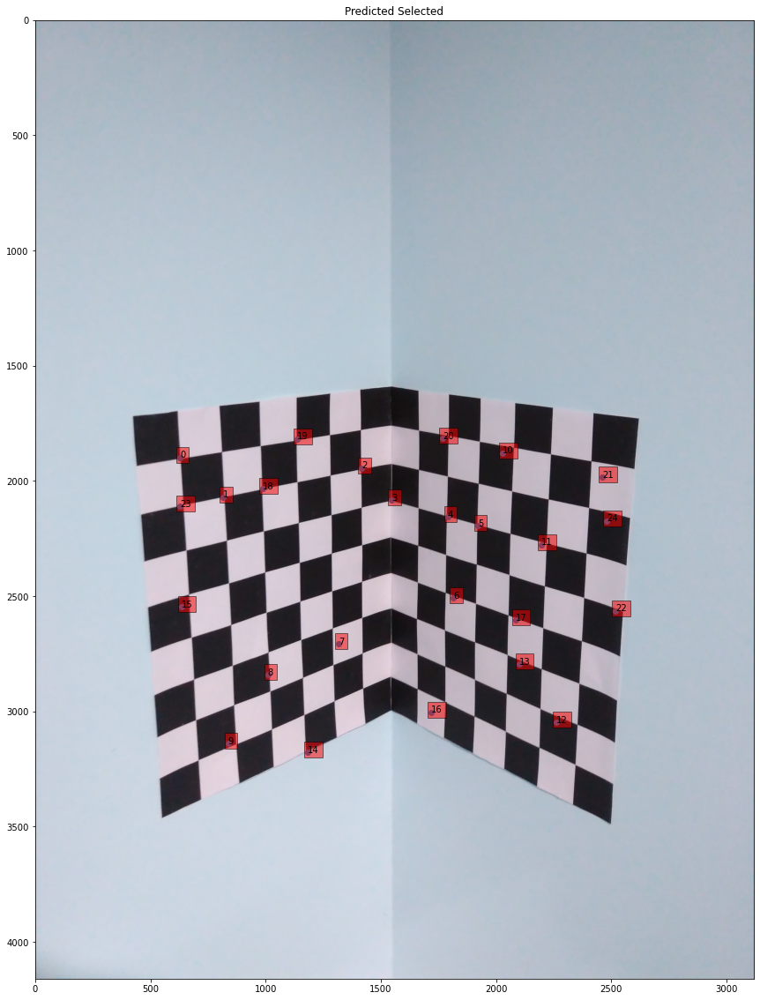

In [58]:
# points from paint tool and stored in the text file that we just read.

%matplotlib inline

plt.figure(figsize=(20,20))
plt.imshow(calibration_object)
plt.scatter(x_list_projected,y_list_projected)
plt.title('Predicted Selected')

for i in range(len(x_list)):
    tupl = list(zip(x_list,y_list))
    plt.text(x_list_projected[i],y_list_projected[i],i,bbox=dict(facecolor='red', alpha=0.5))


plt.show()

In [ ]:
#As can be seen that the projected points are very close to the originally selected points in most cases

Using reference : https://www.youtube.com/watch?v=9D5rrtCC_E0

10.0


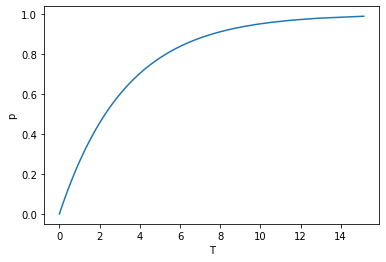

In [59]:


e=0.2
s=6
p=0.95
T=np.log(1-p)/np.log(1-(1-e)**s)
print(np.round(T))
y=np.arange(0,1,0.01)
x=np.log(1-y)/np.log(1-(1-e)**s)
plt.xlabel('T')
plt.ylabel('p')
plt.plot(x,y)

